<a href="https://colab.research.google.com/github/pankaj-beldar/Capstone_2_Appliance_Energy_Prediction/blob/main/Copstone_2__Appliance_Energy_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **1 Problem Statement**
Data-driven prediction of energy use of appliances
The data set is at **10 min** for about **4.5 months**. The house temperature and humidity conditions
were monitored with a ZigBee wireless sensor network. Each wireless node transmitted the
temperature and humidity conditions around 3.3 min. Then, the wireless data was averaged for
10 minutes periods. The energy data was logged every 10 minutes with m-bus energy meters.
Weather from the nearest airport weather station (Chievres Airport, Belgium) was downloaded
from a public data set from Reliable Prognosis (rp5.ru) and merged together with the
experimental data sets using the date and time column. Two random variables have been
included in the data set for testing the regression models and to filter out non-predictive attributes
(parameters).


#2 **Data Description**

**date:** time year-month-day hour:minute:second

**Appliances:** energy use in Wh (Dependent variable)

**lights:** energy use of light fixtures in the house in Wh (Drop this column)

**T1**, Temperature in kitchen area, in Celsius

**RH1**: Humidity in kitchen area, in % T2, 

**Temperature**: in living room area, in Celsius 

**RH2**:
Humidity in living room area, in %

**T3:** Temperature in laundry room area

**RH3:** Humidity in laundry room area, in % 

**T4:** Temperature in office room, in Celsius 

**RH4:**Humidity in office room, in %

**T5:** Temperature in bathroom, in Celsius

**RH5:** Humidity in bathroom, in % T6, Temperature outside the building (north side), in Celsius

**RH6:** Humidity outside the building (north side), in %

**T7:** Temperature in ironing room , in Celsius

**RH7:** Humidity in ironing room, in % T8, Temperature in teenager room 2, in Celsius 

**RH8**: Humidity in teenager room 2, in %

**T9:** Temperature in parents room, in Celsius

**RH9:** Humidity in parents room, in % To, Temperature outside (from Chievres weather station), inCelsius Pressure (from Chievres weather station), in mm Hg RHout, Humidity outside (from
Chievres weather station), in %

**Wind speed:** (from Chievres weather station), in m/s

**Visibility:** (from Chievres weather station), in km

**Tdewpoint:** (from Chievres weather station), Â°C

**rv1:** Random variable 1, nondimensional

**rv2:** Random variable 2, nondimensional

Where indicated, hourly data (then interpolated) from the nearest airport weather station
(Chievres Airport, Belgium) was downloaded from a public data set from Reliable Prognosis,
rp5.ru. Permission was obtained from Reliable Prognosis for the distribution of the 4.5 months of
weather data.

# 3 Importing Libraries and Dataset 

In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
df = pd.read_csv('/content/data_application_energy.csv', parse_dates=['date'])


###Inspection

In [4]:
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


Dropping Lights column as instructed


In [5]:
df.drop('lights', axis =1, inplace = True)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 28 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         19735 non-null  datetime64[ns]
 1   Appliances   19735 non-null  int64         
 2   T1           19735 non-null  float64       
 3   RH_1         19735 non-null  float64       
 4   T2           19735 non-null  float64       
 5   RH_2         19735 non-null  float64       
 6   T3           19735 non-null  float64       
 7   RH_3         19735 non-null  float64       
 8   T4           19735 non-null  float64       
 9   RH_4         19735 non-null  float64       
 10  T5           19735 non-null  float64       
 11  RH_5         19735 non-null  float64       
 12  T6           19735 non-null  float64       
 13  RH_6         19735 non-null  float64       
 14  T7           19735 non-null  float64       
 15  RH_7         19735 non-null  float64       
 16  T8  

It is observed that all the features other than date is a numerical attribute and no null values are present in the given data

Object type attribute date is converted to datetype and its characteristics such as day of the month, day of the week, month, year, hour of day and minutes are extracted individually to make better sense 

In [7]:
df.describe()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


since mean,maximum and minimum value of columns 'year' and 'seconds' is same with 0 standard deviation, we can drop these as well as they are zero-variance attributes 

In [8]:
df.shape

(19735, 28)

In [9]:
df.columns

Index(['date', 'Appliances', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4',
       'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9',
       'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

Looking for duplicate rows

In [10]:
df.duplicated().any()

False

One can approach the following problem using Traditional Supervised ML models and Time Series models as well since the data provides a time component.

Traditional Supervised ML models will be trained as of now

'date' column is extracted to get features like 'year', 'time_of_day', 'day_of_month' and 'day_of_week'

In [11]:
df['date'] = pd.to_datetime(df['date'])
df['time_of_day'] = df['date'].dt.hour 
df['day_of_month'] = df['date'].dt.day 
df['day_of_week'] = df['date'].dt.dayofweek
df['month']=df['date'].dt.month
df['month_name']=df['date'].dt.month_name()
df['day_name'] = df['date'].dt.day_name()

In [12]:
df.head()

,date,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,Visibility,Tdewpoint,rv1,rv2,time_of_day,day_of_month,day_of_week,month,month_name,day_name
0,2016-01-11 17:00:00,60,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,63.000000,5.3,13.275433,13.275433,17,11,0,1,January,Monday
1,2016-01-11 17:10:00,60,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,59.166667,5.2,18.606195,18.606195,17,11,0,1,January,Monday
2,2016-01-11 17:20:00,50,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,55.333333,5.1,28.642668,28.642668,17,11,0,1,January,Monday
3,2016-01-11 17:30:00,50,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,51.500000,5.0,45.410389,45.410389,17,11,0,1,January,Monday
4,2016-01-11 17:40:00,60,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,47.666667,4.9,10.084097,10.084097,17,11,0,1,January,Monday


In [13]:
def phase_day(row):
  if 18 <= int(row['time_of_day'])<24:
    return 'Evening'
  if 6 > int(row['time_of_day']):
    return 'Night'
  if 6 <= int(row['time_of_day']) <12:
    return 'Morning'
  if 12 <= int(row['time_of_day'])< 18:
    return 'AfterNoon'


In [14]:
df['Phase_of_Day'] = df.apply(lambda row: phase_day(row), axis =1)

In [15]:
df.drop('date', axis =1, inplace = True)

In [16]:
df.columns

Index(['Appliances', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4',
       'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9',
       'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'time_of_day', 'day_of_month', 'day_of_week',
       'month', 'month_name', 'day_name', 'Phase_of_Day'],
      dtype='object')

In [17]:
numerical_features = [ 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4',
       'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9',
       'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'time_of_day', 'day_of_month']
dependent_feature = ['Appliances']
categorical_feature = [ 'Phase_of_Day','day_of_week']

In [18]:
df.head()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,Tdewpoint,rv1,rv2,time_of_day,day_of_month,day_of_week,month,month_name,day_name,Phase_of_Day
0,60,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,...,5.3,13.275433,13.275433,17,11,0,1,January,Monday,AfterNoon
1,60,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,...,5.2,18.606195,18.606195,17,11,0,1,January,Monday,AfterNoon
2,50,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,...,5.1,28.642668,28.642668,17,11,0,1,January,Monday,AfterNoon
3,50,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,...,5.0,45.410389,45.410389,17,11,0,1,January,Monday,AfterNoon
4,60,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,...,4.9,10.084097,10.084097,17,11,0,1,January,Monday,AfterNoon


In [19]:
df.describe()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,time_of_day,day_of_month,day_of_week,month
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,...,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033,11.502002,16.057411,2.977249,3.101647
std,102.524891,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,...,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634,6.921953,8.450998,1.985617,1.339200
min,10.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,...,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322,0.000000,1.000000,0.000000,1.000000
25%,50.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,...,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889,6.000000,9.000000,1.000000,2.000000
50%,60.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,...,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653,12.000000,16.000000,3.000000,3.000000
75%,100.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,...,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769,17.000000,23.000000,5.000000,4.000000
max,1080.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,...,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530,23.000000,31.000000,6.000000,5.000000


#EDA



##Univariate Analysis

###Numerical Features

 #### Distribution 

In [20]:
len(numerical_features)

28

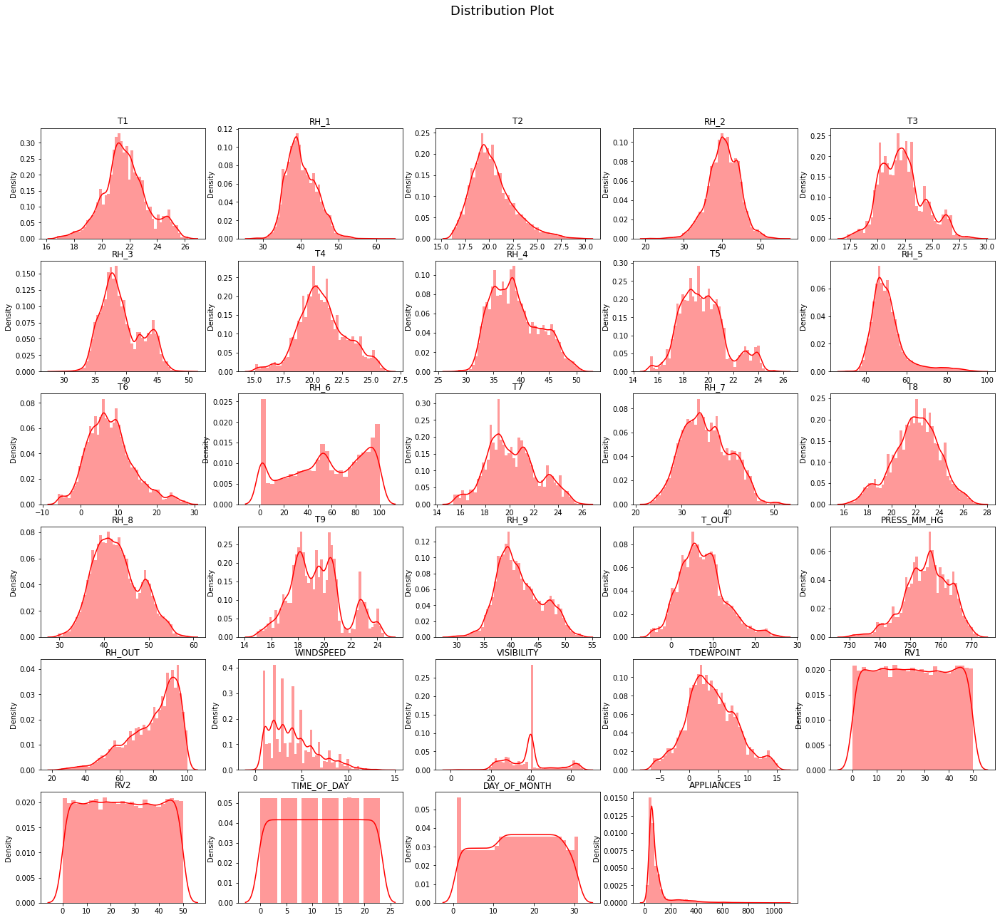

In [21]:
plt.figure(figsize=(24, 20))
plt.suptitle("Distribution Plot", fontsize=18, y=1)

for n, ticker in enumerate(numerical_features + ['Appliances']):
    ax = plt.subplot(6, 5, n + 1)
    sns.distplot(df[ticker], color='r')
    ax.set_title(ticker.upper())
    ax.set_xlabel("")

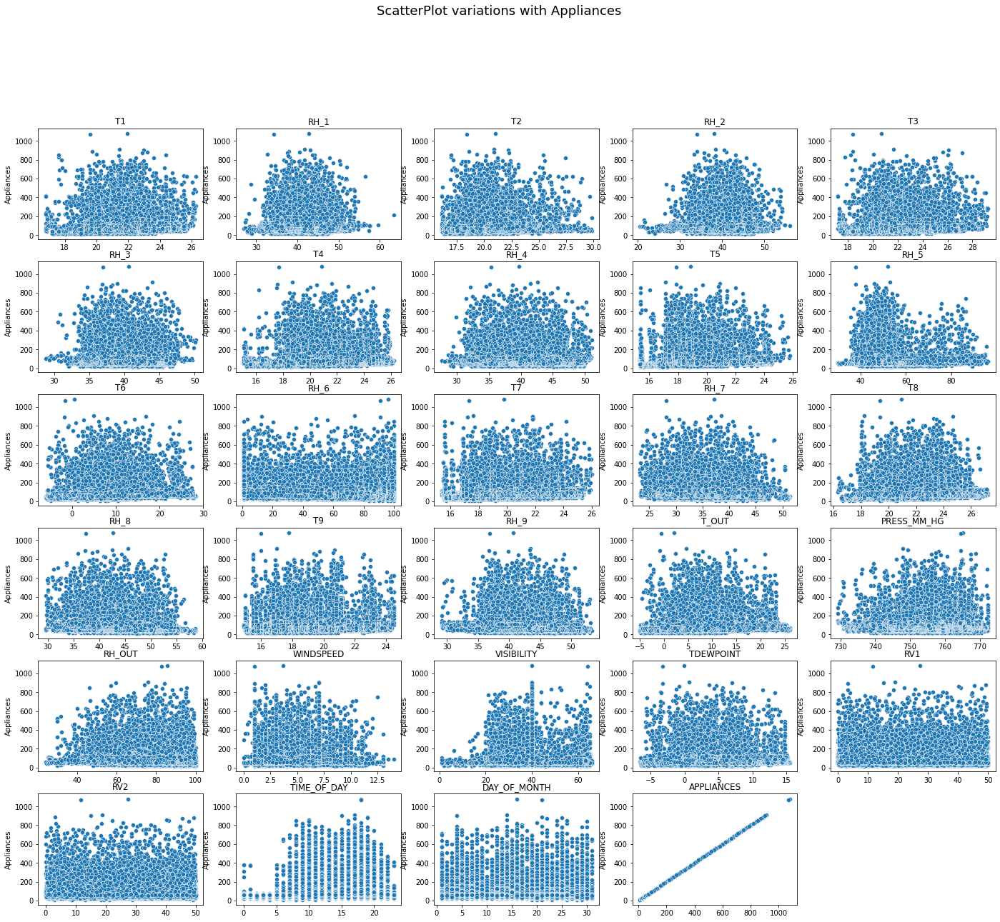

In [22]:
plt.figure(figsize=(24, 20))
plt.suptitle("ScatterPlot variations with Appliances ", fontsize=18, y=1)

for n, ticker in enumerate(numerical_features + ['Appliances']):
    ax = plt.subplot(6, 5, n + 1)
    sns.scatterplot(df[ticker], x='ticker', y=df['Appliances'])
    ax.set_title(ticker.upper())
    ax.set_xlabel("")

#### Q-Q plot

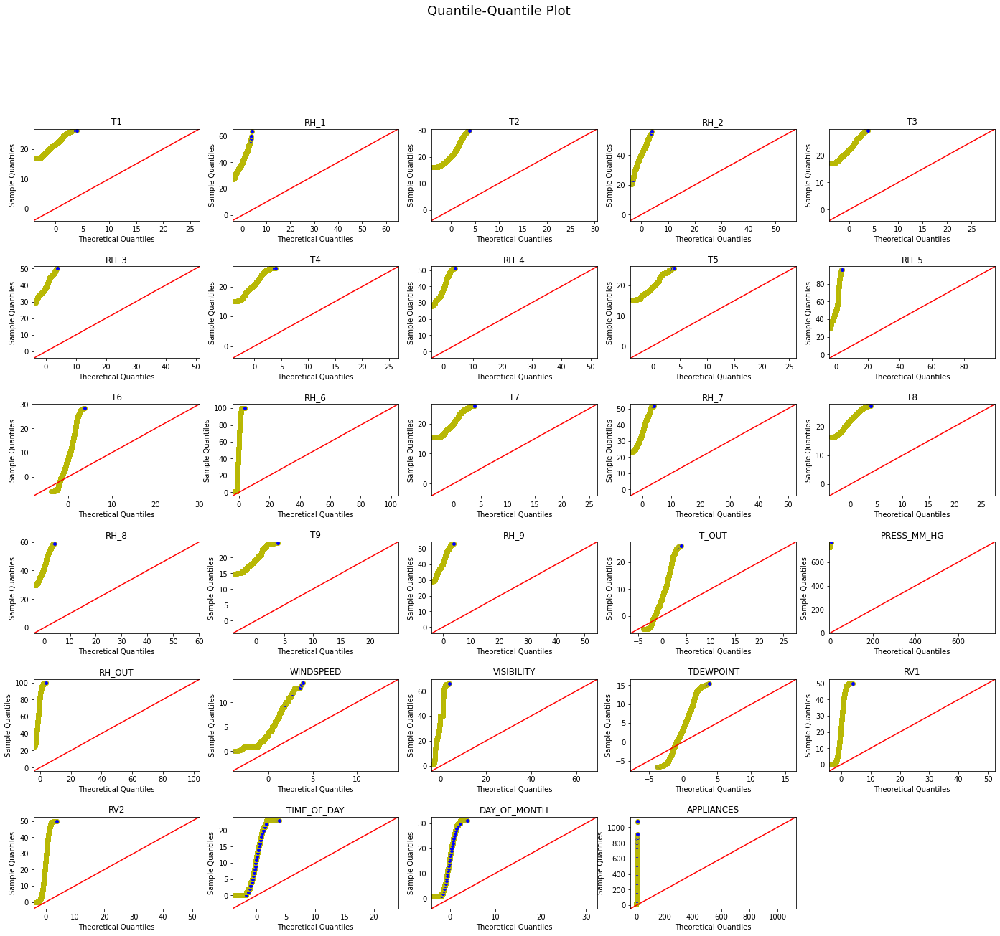

In [23]:
import statsmodels.api as sm
import pylab as py
import scipy.stats as stats

plt.figure(figsize=(24, 20))
plt.suptitle("Quantile-Quantile Plot", fontsize=18, y=1)

for n, ticker in enumerate(numerical_features+ ['Appliances']):
    ax = plt.subplot(6, 5, n + 1)
    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    sm.qqplot(df[ticker],line='45',color='y', ax = ax)
    ax.set_title(ticker.upper())

####Box Plot

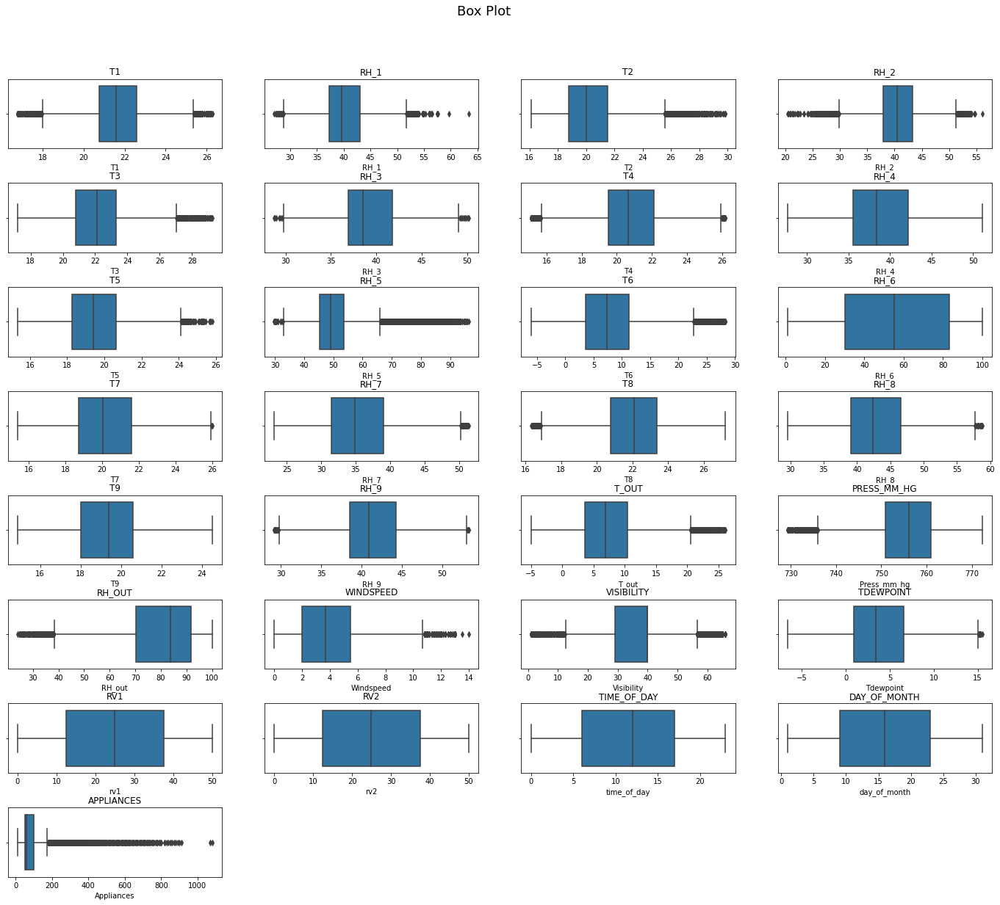

In [24]:

plt.figure(figsize=(24, 20))
plt.suptitle("Box Plot", fontsize=18, y=0.95)

for n, ticker in enumerate(numerical_features+ ['Appliances']):
    
    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    
    sns.boxplot(df[ticker],ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

Text(0.5, 1.0, 'Hourly Day Consumption')

<Figure size 720x360 with 0 Axes>

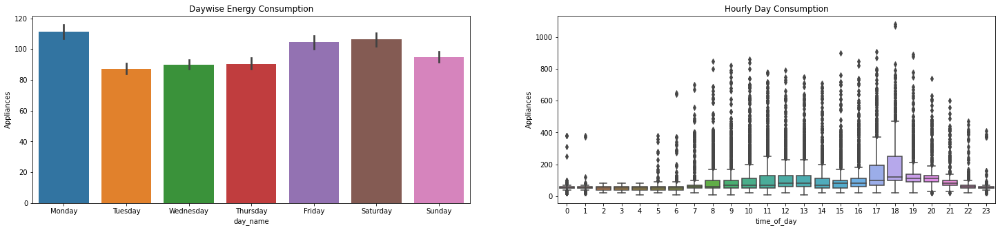

In [25]:
plt.figure(figsize=(10,5))
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 5))
ax = axes.flatten()
sns.barplot(data=df, x='day_name', y='Appliances', ax=ax[0])
sns.boxplot(data=df, x='time_of_day', y='Appliances', ax=ax[1])
ax[0].set_title('Daywise Energy Consumption')
ax[1].set_title('Hourly Day Consumption')

In [26]:
df.corr()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,time_of_day,day_of_month,day_of_week,month
Appliances,1.000000,0.055447,0.086031,0.120073,-0.060465,0.085060,0.036292,0.040281,0.016965,0.019760,...,-0.152282,0.087122,0.000230,0.015353,-0.011145,-0.011145,0.216792,0.002366,0.003060,-0.011606
T1,0.055447,1.000000,0.164006,0.836834,-0.002509,0.892402,-0.028550,0.877001,0.097861,0.885247,...,-0.345481,-0.087654,-0.076210,0.571309,-0.006203,-0.006203,0.178858,-0.127088,0.001381,0.706305
RH_1,0.086031,0.164006,1.000000,0.269839,0.797535,0.253230,0.844677,0.106180,0.880359,0.205797,...,0.274126,0.204932,-0.021057,0.639106,-0.000699,-0.000699,0.018594,-0.041397,-0.053782,-0.094048
T2,0.120073,0.836834,0.269839,1.000000,-0.165610,0.735245,0.121497,0.762066,0.231563,0.720550,...,-0.505291,0.052495,-0.069721,0.582602,-0.011087,-0.011087,0.254784,-0.156913,0.000602,0.533479
RH_2,-0.060465,-0.002509,0.797535,-0.165610,1.000000,0.137319,0.678326,-0.047304,0.721435,0.110409,...,0.584911,0.069190,-0.005368,0.499152,0.006275,0.006275,-0.183322,0.037117,-0.044249,-0.097914
T3,0.085060,0.892402,0.253230,0.735245,0.137319,1.000000,-0.011234,0.852778,0.122737,0.888169,...,-0.281718,-0.100776,-0.102310,0.645886,-0.005194,-0.005194,0.037624,-0.077190,-0.017514,0.790365
RH_3,0.036292,-0.028550,0.844677,0.121497,0.678326,-0.011234,1.000000,-0.140457,0.898978,-0.050062,...,0.356192,0.263188,0.017041,0.414387,-0.000477,-0.000477,-0.052392,-0.048427,-0.035182,-0.414359
T4,0.040281,0.877001,0.106180,0.762066,-0.047304,0.852778,-0.140457,1.000000,-0.048650,0.871813,...,-0.388602,-0.185747,-0.104768,0.519471,-0.001815,-0.001815,0.088407,-0.121867,-0.091006,0.789168
RH_4,0.016965,0.097861,0.880359,0.231563,0.721435,0.122737,0.898978,-0.048650,1.000000,0.091812,...,0.336813,0.300192,0.002636,0.616509,-0.001787,-0.001787,-0.019068,-0.005404,-0.005749,-0.258167
T5,0.019760,0.885247,0.205797,0.720550,0.110409,0.888169,-0.050062,0.871813,0.091812,1.000000,...,-0.273953,-0.145011,-0.084164,0.588362,-0.005490,-0.005490,0.071340,-0.128832,-0.040827,0.785865


###Categorical Features

Although these features aren't of type 'Object', they are categorical in nature

Text(0.5, 1.0, 'Daywise Consumption')

<Figure size 720x360 with 0 Axes>

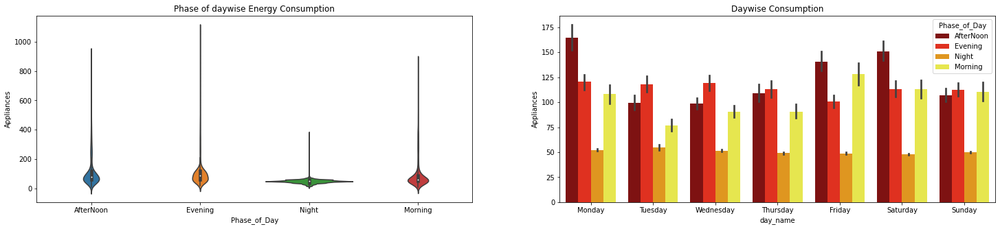

In [27]:
plt.figure(figsize=(10,5))
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 5))
ax = axes.flatten()
sns.violinplot(x='Phase_of_Day', y='Appliances', data =df, ax=ax[0])
sns.barplot(data=df, x='day_name', y='Appliances',hue='Phase_of_Day',palette='hot' ,ax=ax[1])
ax[0].set_title('Phase of daywise Energy Consumption')
ax[1].set_title('Daywise Consumption')

##Bivariate Analysis

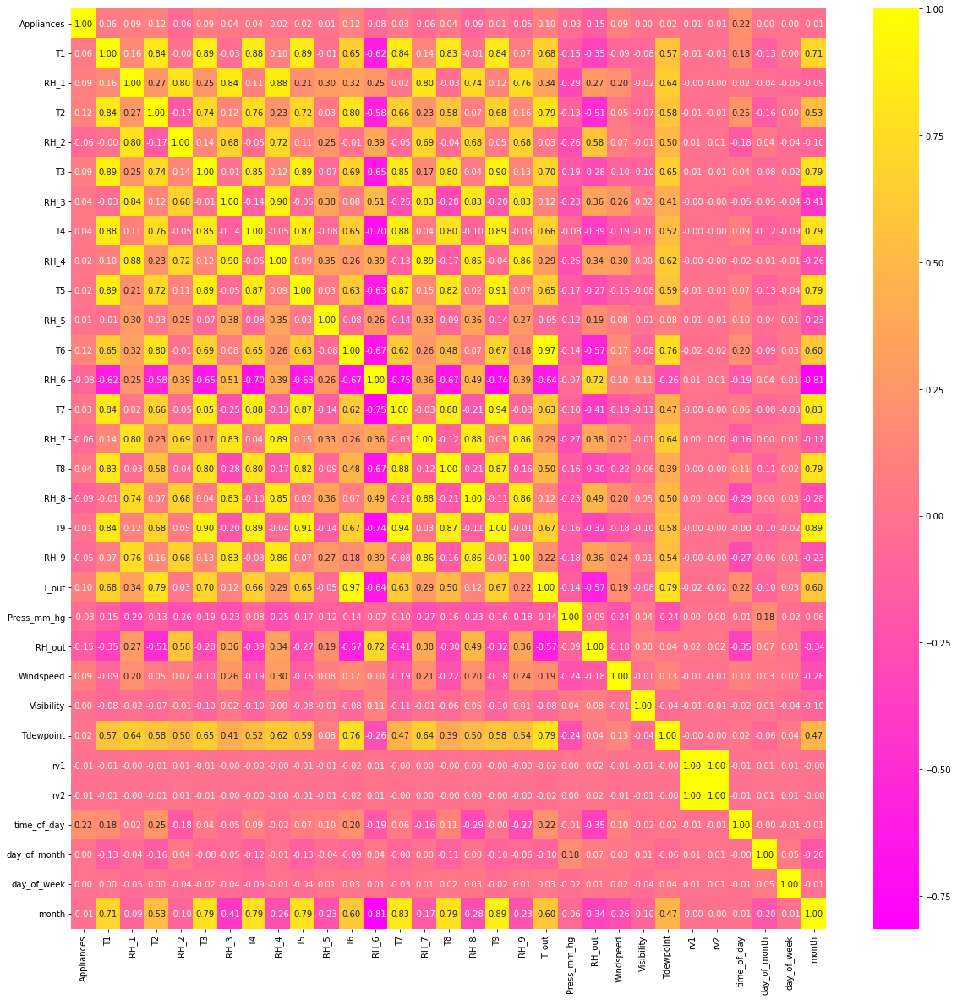

In [28]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True, cmap='spring', fmt='.2f')

'rv1' and 'rv2' have correlation of 1

In [29]:
(df['rv1'] ==df['rv2']).unique()

array([ True])

Since both the features are identical, one of them is eliminated from the dataset

In [30]:
df.drop('rv2', axis = 1, inplace = True)
numerical_features.remove('rv2')

In [31]:
numerical_features

['T1',
 'RH_1',
 'T2',
 'RH_2',
 'T3',
 'RH_3',
 'T4',
 'RH_4',
 'T5',
 'RH_5',
 'T6',
 'RH_6',
 'T7',
 'RH_7',
 'T8',
 'RH_8',
 'T9',
 'RH_9',
 'T_out',
 'Press_mm_hg',
 'RH_out',
 'Windspeed',
 'Visibility',
 'Tdewpoint',
 'rv1',
 'time_of_day',
 'day_of_month']

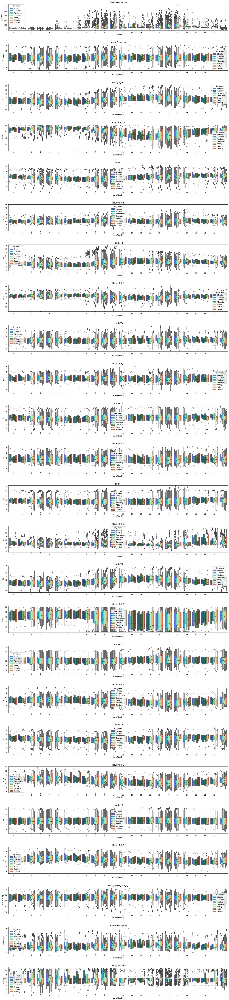

In [32]:
measurements = ['Appliances','Tdewpoint','T_out','RH_out','T1','RH_1','T2','RH_2','T3','RH_3','T4','RH_4','T5','RH_5','T6','RH_6','T7','RH_7','T8','RH_8','T9','RH_9','Press_mm_hg','Windspeed','Visibility',]
plt.figure(figsize=(25, 120))
for n, measurement in enumerate(measurements):
    # add a new subplot iteratively
    ax = plt.subplot(26, 1, n + 1)
    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    sns.boxplot(x= df['time_of_day'], y = df[measurement], hue = df['day_name'] ,palette = 'rainbow', ax = ax)
    plt.xticks(np.arange(0,23,1))
    plt.title(f"Hourly {measurement}")
    plt.xlabel("Hour of the Day")
    plt.ylabel(measurement)
plt.show()


#Feature Engineering and Selection



## Numerical Outliers

Transformation to make data more gaussian distributed

<Figure size 1800x1800 with 0 Axes>

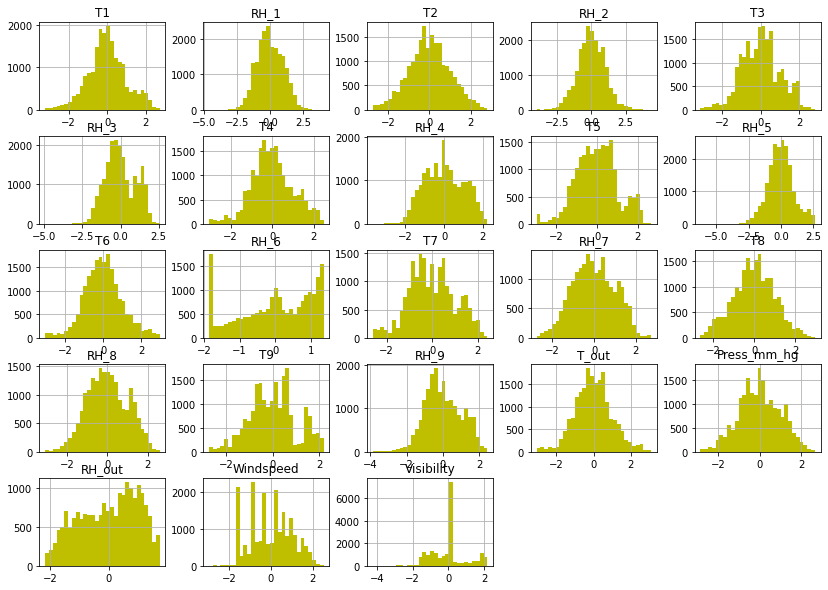

In [33]:
from sklearn.preprocessing import PowerTransformer
plt.figure(figsize=(25,25))
# Init
pt = PowerTransformer()

df[numerical_features[:-4]] = pd.DataFrame(pt.fit_transform(df[numerical_features[:-4]]), columns= numerical_features[:-4])

df[numerical_features[:-4]].hist(figsize=(14, 10), bins = 30, color='y');

### Handling Outliers

#### Inter Quantile method

In [34]:

for ftr in numerical_features+['Appliances']  : 
  print(ftr,'\n')
  q25, q75 = np.percentile(df[ftr], 25), np.percentile(df[ftr], 75)
  iqr = q75 - q25
  print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (q25, q75, iqr))
  # calculate the outlier cutoff
  cut_off = iqr * 1.5
  lower, upper = q25 - cut_off, q75 + cut_off
  print(f"\nlower = {lower} and upper = {upper} \n ")
  # identify outliers
  outliers = [x for x in df[ftr] if x < lower or x > upper]
  print('Identified outliers: %d' % len(outliers))
  #removing outliers
  if len(outliers)!=0:
    
    def label(row):
      if row[ftr] > upper: 
        return 1
      if row[ftr] < lower:
        return 1
      else:
        return 0

    def bin(row):
      if row[ftr]> upper:
        return upper
      if row[ftr] < lower:
        return lower
      else:
        return row[ftr]
    
    df[ftr + '_Outlier'] =  df.apply (lambda row: label(row), axis=1)
    df[ftr] =  df.apply (lambda row: bin(row), axis=1)
    print(f"{ftr} Outliers Removed")
  print("\n-------\n")
  
 

T1 

Percentiles: 25th=-0.565, 75th=0.581, IQR=1.146

lower = -2.2836676230329873 and upper = 2.299703020355362 
 
Identified outliers: 458
T1 Outliers Removed

-------

RH_1 

Percentiles: 25th=-0.710, 75th=0.757, IQR=1.467

lower = -2.9102943560677157 and upper = 2.9580504104125733 
 
Identified outliers: 57
RH_1 Outliers Removed

-------

T2 

Percentiles: 25th=-0.681, 75th=0.669, IQR=1.350

lower = -2.7062907073386384 and upper = 2.693560404797877 
 
Identified outliers: 29
T2 Outliers Removed

-------

RH_2 

Percentiles: 25th=-0.649, 75th=0.684, IQR=1.333

lower = -2.64863648738653 and upper = 2.684322726566248 
 
Identified outliers: 253
RH_2 Outliers Removed

-------

T3 

Percentiles: 25th=-0.711, 75th=0.577, IQR=1.289

lower = -2.6443178882451766 and upper = 2.5099282440396884 
 
Identified outliers: 187
T3 Outliers Removed

-------

RH_3 

Percentiles: 25th=-0.685, 75th=0.837, IQR=1.522

lower = -2.968698096089757 and upper = 3.1200746920725844 
 
Identified outliers: 32
RH_

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 53 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Appliances           19735 non-null  float64
 1   T1                   19735 non-null  float64
 2   RH_1                 19735 non-null  float64
 3   T2                   19735 non-null  float64
 4   RH_2                 19735 non-null  float64
 5   T3                   19735 non-null  float64
 6   RH_3                 19735 non-null  float64
 7   T4                   19735 non-null  float64
 8   RH_4                 19735 non-null  float64
 9   T5                   19735 non-null  float64
 10  RH_5                 19735 non-null  float64
 11  T6                   19735 non-null  float64
 12  RH_6                 19735 non-null  float64
 13  T7                   19735 non-null  float64
 14  RH_7                 19735 non-null  float64
 15  T8                   19735 non-null 

In [36]:
df.describe()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,T6_Outlier,T8_Outlier,RH_8_Outlier,T9_Outlier,RH_9_Outlier,T_out_Outlier,Press_mm_hg_Outlier,Visibility_Outlier,Tdewpoint_Outlier,Appliances_Outlier
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,78.887256,0.005158,0.001548,-0.000011,-0.000098,0.001266,0.001183,0.003414,0.000059,0.002020,...,0.027717,0.001115,0.001723,0.000507,0.003902,0.024880,0.000811,0.114315,0.000507,0.108335
std,42.961298,0.981467,0.993275,0.999890,0.984568,0.994727,0.995791,0.990724,0.999827,0.994382,...,0.164166,0.033370,0.041472,0.022505,0.062343,0.155762,0.028463,0.318201,0.022505,0.310811
min,10.000000,-2.283668,-2.910294,-2.706291,-2.648636,-2.644318,-2.968698,-2.522621,-3.152024,-2.663552,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50.000000,-0.564904,-0.709665,-0.681347,-0.648777,-0.711476,-0.685408,-0.632792,-0.786492,-0.682661,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,60.000000,-0.035920,-0.071628,-0.012123,-0.018626,-0.002872,-0.116141,-0.064543,-0.033580,-0.012662,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,100.000000,0.580939,0.757421,0.668616,0.684463,0.577086,0.836785,0.627093,0.790530,0.637933,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,175.000000,2.299703,2.958050,2.693560,2.684323,2.509928,2.567892,2.473632,2.243383,2.618823,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


###Train Test Split

In [37]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

In [38]:
X = df.drop(columns=['Appliances','day_name','month_name','Phase_of_Day','Appliances_Outlier'])
y=df['Appliances']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size =0.2,  random_state=5)

#### Scaling

In [39]:
#function to scale
def do_scale(X_train, X_test, scaling_type = StandardScaler):
  scaler = scaling_type()
  scaler.fit(X_train)
  X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns = X_train.columns)
  X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns = X_test.columns)
  return X_train_scaled, X_test_scaled


In [40]:
X_train_scaled, X_test_scaled = do_scale(X_train,X_test)

In [41]:
X_train_scaled.shape, X_test_scaled.shape

((15788, 48), (3947, 48))

##Functions

In [42]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, max_error
from sklearn.linear_model import  LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor, BaggingRegressor, GradientBoostingRegressor, RandomForestRegressor, VotingRegressor, StackingRegressor

In [43]:
def get_features_importance (optimal_model,X_train):
  '''
  shows the graph of feature importance
  '''
  features = X_train.columns
  importances = optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.figure(figsize=(15,10))
  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='red', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')

  plt.show()

In [44]:
report = {
    'model_type':[],
    'model_name':[],
    'rmse':[],
    'mae':[],
    'R2':[],
    'adjusted R2':[]

}

In [45]:

# function to evaluate and update model and score
def evaluate(modeltype, modelname, Model, X_train, y_train, X_test, y_test):
  from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, max_error

  if modelname in report['model_name']:
    print("Prexisting Model")
    return 0
  X_tr = X_train.copy()
  X_te = X_test.copy()

  print(f"-------\nTraining {str(Model)} ...")
  Model.fit(X_tr, y_train)

  print(f"\nPredicting{str(Model)} scores ...")

  y_pred = Model.predict(X_te)

  mae = mean_absolute_error(y_test,y_pred)
  report['mae'].append(mae)


  R2 = r2_score(y_test,y_pred)
  report['R2'].append(R2)

  rmse = np.sqrt(mean_squared_error(y_test,y_pred))
  report['rmse'].append(rmse)

  adj_r2=1-(1-r2_score(y_test**2,y_pred**2))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
  report['adjusted R2'].append(adj_r2)


  report['model_name'].append(modelname)
  report['model_type'].append(modeltype)

  plt.figure(figsize=(20,10))
  plt.plot((y_pred)[:100])
  plt.plot((np.array(y_test)[:100]))
  plt.legend(["Predicted","Actual"])
  plt.title(modelname)
  plt.show()



  print(f"\nReport Updated\n----------\n")




In [46]:
#displays report in a dataframe
def display_report():
  return pd.DataFrame(report)

In [47]:
def get_models():
  models, names, model_type = list(), list(), list()

  # LinearReg
  models.append(LinearRegression())
  names.append('Linear Regression')
  model_type.append('Linear')

  #Lasso
  models.append(Lasso(alpha =0.2))
  names.append('Lasso Regression')
  model_type.append('Linear')

  #Ridge
  models.append(Ridge(alpha =0.5))
  names.append('Ridge Regression')
  model_type.append('Linear')


  # DecisionTree
  models.append((DecisionTreeRegressor()))
  names.append('DecisionTree Regressor')
  model_type.append('Tree')

  #RandomForest
  models.append(RandomForestRegressor())
  names.append('RandomForest Regressor')
  model_type.append('Ensemble Method')


  # AdaBoosting
  models.append(AdaBoostRegressor())
  names.append('Adaptive Boosting Regressor')
  model_type.append('Ensemble Method')

  # GradientBoosting
  models.append(GradientBoostingRegressor())
  names.append('GradientBoosting Regressor')
  model_type.append('Ensemble Method')

  #Bagging
  models.append(BaggingRegressor())
  names.append('Bagging Regressor')
  model_type.append('Ensemble Method')


  # KNN
  models.append(KNeighborsRegressor())
  names.append('K Neighbors Regressor')
  model_type.append('Neighbours')

  #Linear SVM
  models.append(LinearSVR())
  names.append('Linear SVR')
  model_type.append('SVM')
  
  return models, names, model_type

##Random Variable Evaluation

In [48]:
X_train_scaled.drop('rv1', axis =1, inplace = True)
X_test_scaled.drop('rv1', axis =1, inplace = True)

## Spotchecking ML Models

-------
Training LinearRegression() ...

PredictingLinearRegression() scores ...


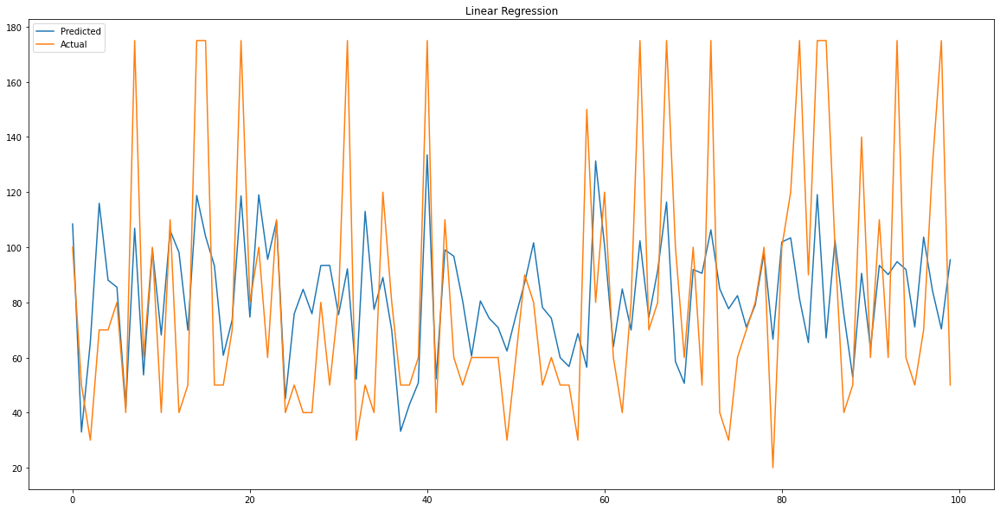


Report Updated
----------

-------
Training Lasso(alpha=0.2) ...

PredictingLasso(alpha=0.2) scores ...


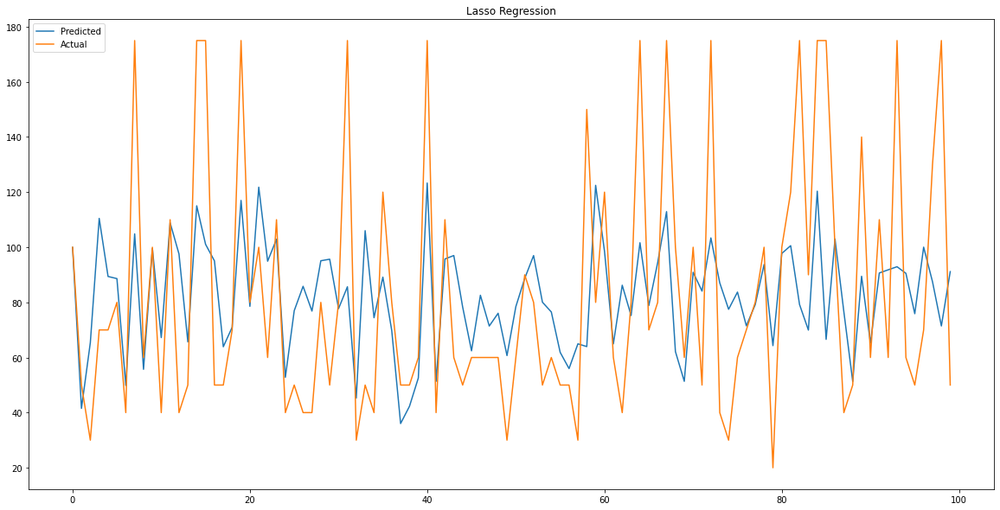


Report Updated
----------

-------
Training Ridge(alpha=0.5) ...

PredictingRidge(alpha=0.5) scores ...


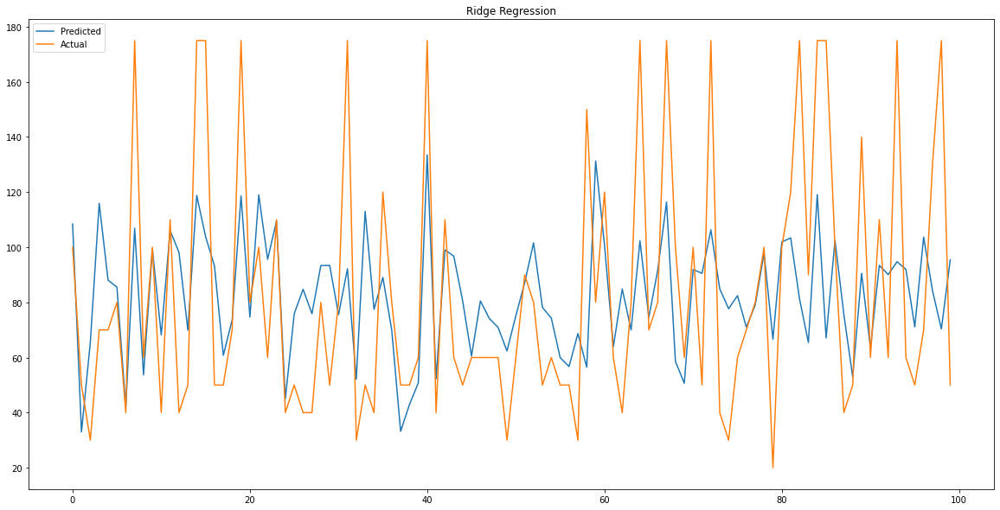


Report Updated
----------

-------
Training DecisionTreeRegressor() ...

PredictingDecisionTreeRegressor() scores ...


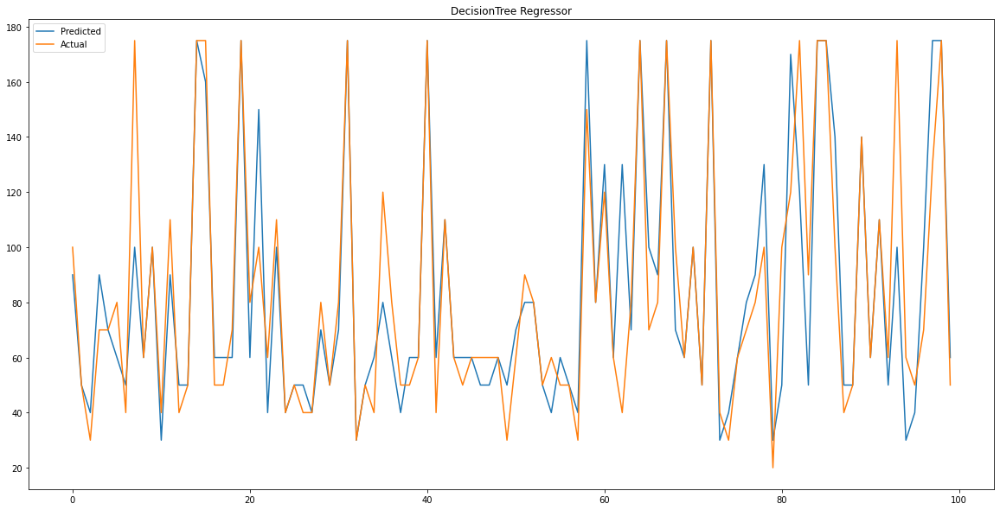


Report Updated
----------

-------
Training RandomForestRegressor() ...

PredictingRandomForestRegressor() scores ...


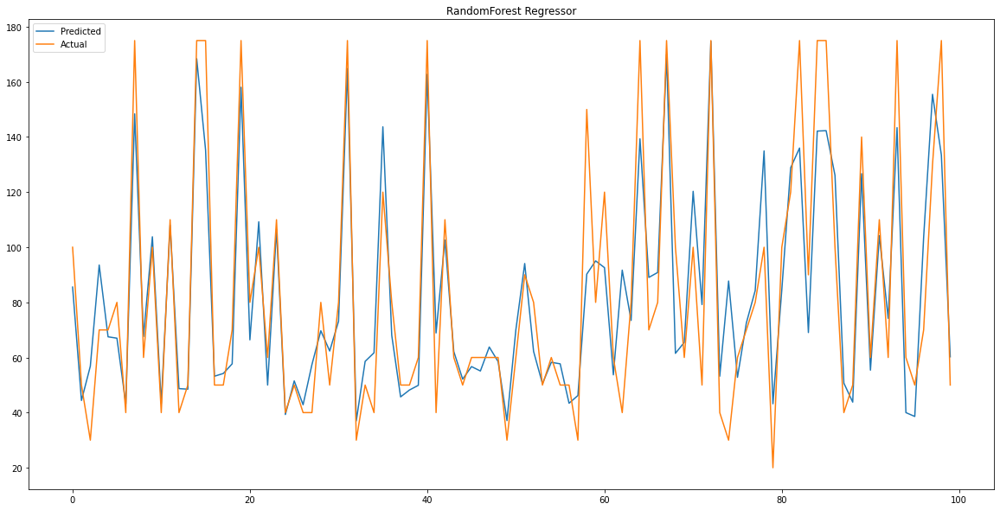


Report Updated
----------

-------
Training AdaBoostRegressor() ...

PredictingAdaBoostRegressor() scores ...


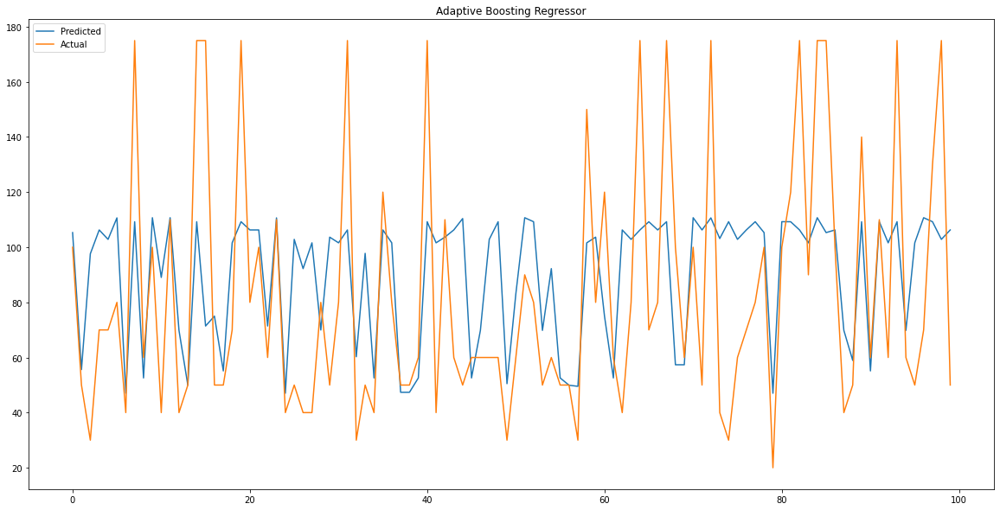


Report Updated
----------

-------
Training GradientBoostingRegressor() ...

PredictingGradientBoostingRegressor() scores ...


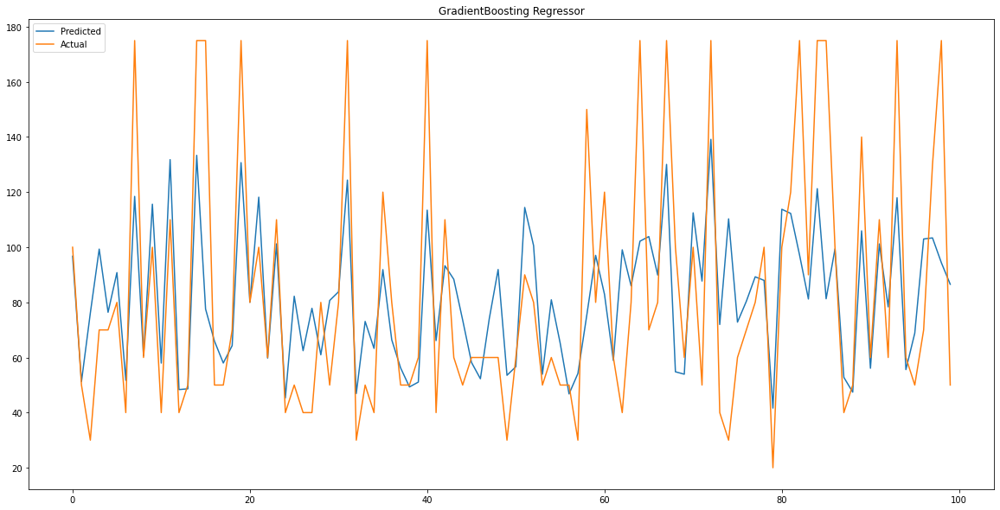


Report Updated
----------

-------
Training BaggingRegressor() ...

PredictingBaggingRegressor() scores ...


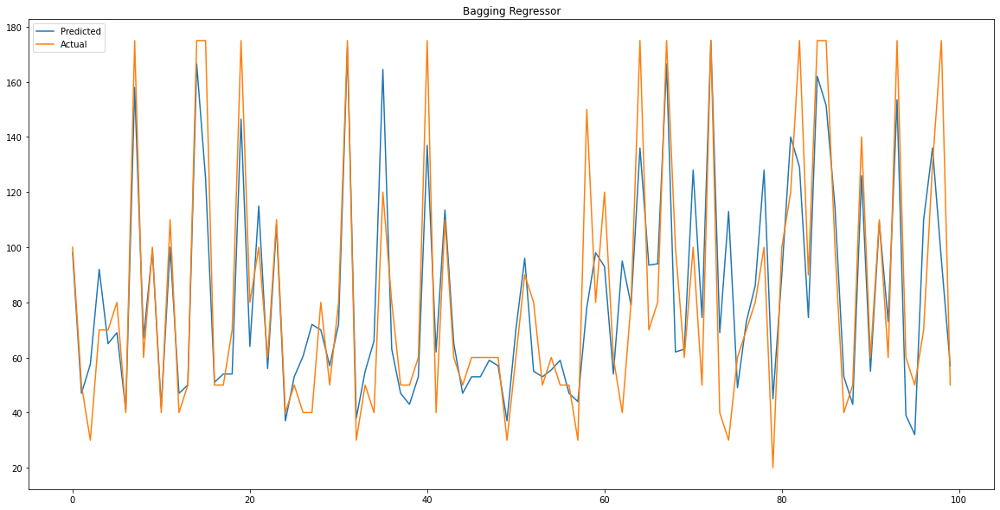


Report Updated
----------

-------
Training KNeighborsRegressor() ...

PredictingKNeighborsRegressor() scores ...


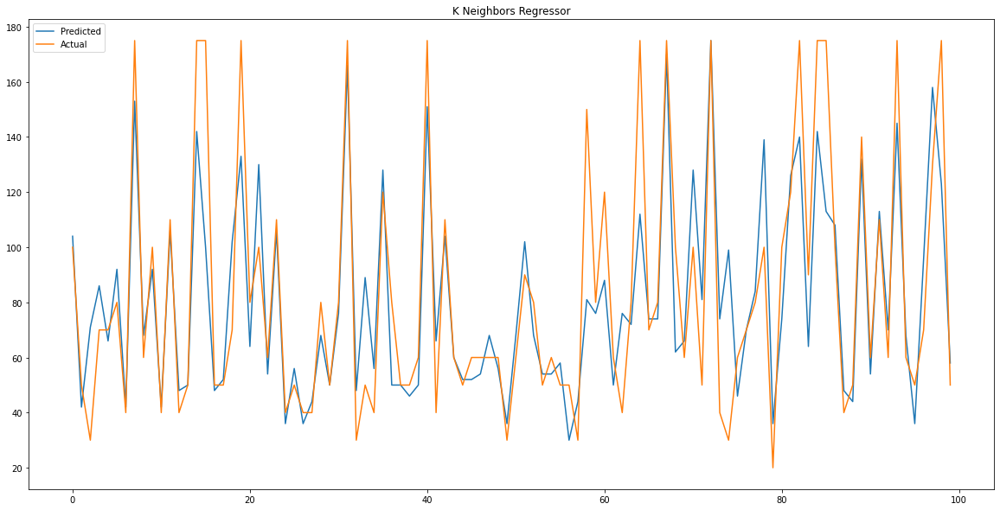


Report Updated
----------

-------
Training LinearSVR() ...

PredictingLinearSVR() scores ...


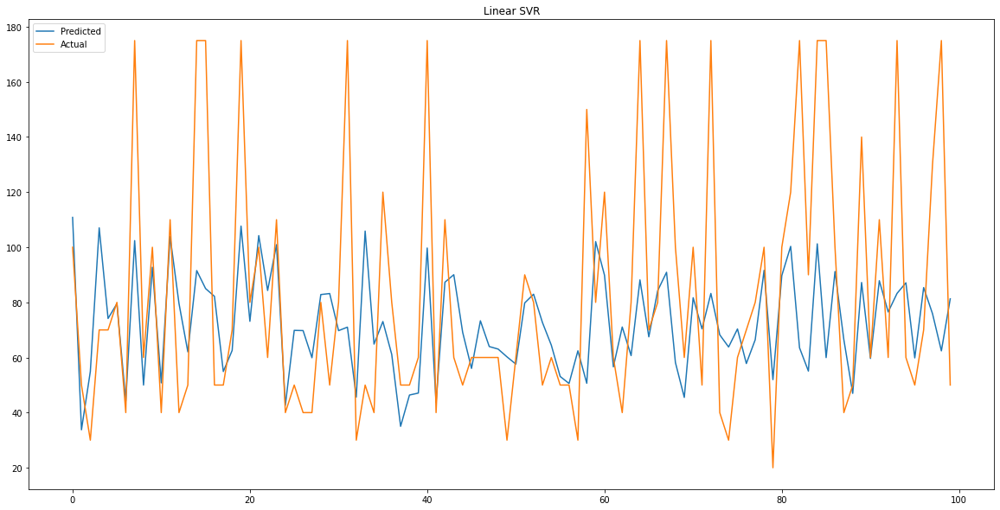


Report Updated
----------



In [49]:
Model, modelname, modeltype = get_models()
for i in range(len(Model)):
  evaluate(modeltype[i], modelname[i], Model[i], X_train_scaled , y_train, X_test_scaled,y_test)

In [50]:
display_report()

,model_type,model_name,rmse,mae,R2,adjusted R2
0,Linear,Linear Regression,37.282236,27.371956,0.266472,0.182583
1,Linear,Lasso Regression,37.541239,27.524358,0.256245,0.164335
2,Linear,Ridge Regression,37.282272,27.371845,0.266471,0.182558
3,Tree,DecisionTree Regressor,28.294123,16.060299,0.577521,0.499371
4,Ensemble Method,RandomForest Regressor,21.716998,14.267190,0.751107,0.694517
5,Ensemble Method,Adaptive Boosting Regressor,38.494560,30.309389,0.217992,0.197844
6,Ensemble Method,GradientBoosting Regressor,32.044206,22.825201,0.458109,0.342302
7,Ensemble Method,Bagging Regressor,23.070173,14.934507,0.719124,0.660761
8,Neighbours,K Neighbors Regressor,25.208635,16.607803,0.664640,0.588071
9,SVM,Linear SVR,39.222153,26.231952,0.188151,0.056745


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 10 Text major ticklabel objects>)

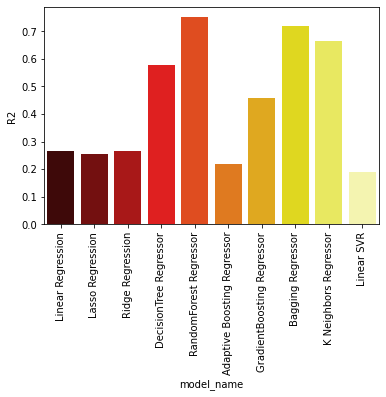

In [51]:
final_report = display_report()
sns.barplot(x = final_report['model_name'], y = final_report['R2'], palette = 'hot')
plt.xticks(rotation = 90)

Spot-checking is a way
of discovering which algorithms
perform well on the machine
learning problem

RandomForest Regressor has the lowest mae, rmse and highest R2 score.



#HyperParameter Tuning

From the observations, it is found
that the Random Forest Regressor
performed the best with the least
RMSE and MAE of 21.003 and
13.983 and the highest R-squared
score of 0.767
In order to improve the performance
of Random Forest Regressor,
RandomSearchCV is used to
optimize its parameters

In [52]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [53]:
seed=1
param_grid = param_grid = { 'bootstrap': [True], 
                          'max_depth': [2, 5, None],
                          'criterion' :['squared_error', 'absolute_error', 'poisson'],
                          'max_features': ['auto', 'log2', 'sqrt'], 
                          'n_estimators': [100, 300 ,400, 450]}
random_forest = RandomForestRegressor(random_state=seed)
kfold = KFold(n_splits= 2)
search = RandomizedSearchCV(estimator= random_forest, param_distributions = param_grid, scoring='r2', n_jobs = -1, verbose = 5)
search_result = search.fit(X_train_scaled, y_train)
search_result

Fitting 5 folds for each of 10 candidates, totalling 50 fits


KeyboardInterrupt: ignored

In [ ]:
search_result.best_params_ , search_result.best_score_

-------
Training RandomForestRegressor(max_features='log2', n_estimators=300) ...

PredictingRandomForestRegressor(max_features='log2', n_estimators=300) scores ...


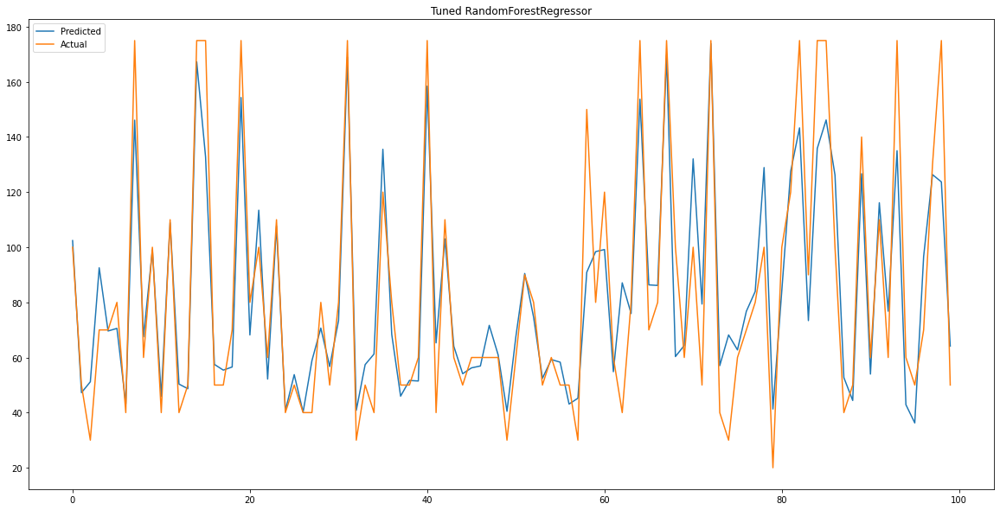


Report Updated
----------



In [54]:
tuned_random_forest = RandomForestRegressor(bootstrap = True, criterion = 'squared_error', max_features = 'log2', n_estimators = 300)
evaluate("Ensemble Method", "Tuned RandomForestRegressor", tuned_random_forest , X_train_scaled , y_train, X_test_scaled,y_test)

In [56]:
display_report().iloc[-1]

model_type                 Ensemble Method
model_name     Tuned RandomForestRegressor
rmse                             21.017749
mae                               14.08315
R2                                0.766877
adjusted R2                       0.701441
Name: 10, dtype: object

Upon tuning, the r2 score has been improved from 0.767188 to 0.770887.

#Model Explainability

Importance: Feature
Importance refers to techniques that
assign a score to input features based
on how useful they are at predicting
a target variable.
Feature importance scores provide
insight into the data and the deployed
model.

By looking at the Feature Importance
graphs and the contribution chart
from ELI5, we can gather that the
appliance energy consumption
largely depends on the time of the
day and temperatures in rooms 3 and
2.

##Feature Importance

In [87]:
def get_features_importance (optimal_model,X_train):
  '''
  shows the graph of feature importance
  '''
  features = X_train.columns
  importances = optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.figure(figsize=(15,15))
  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='m', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')

  plt.show()

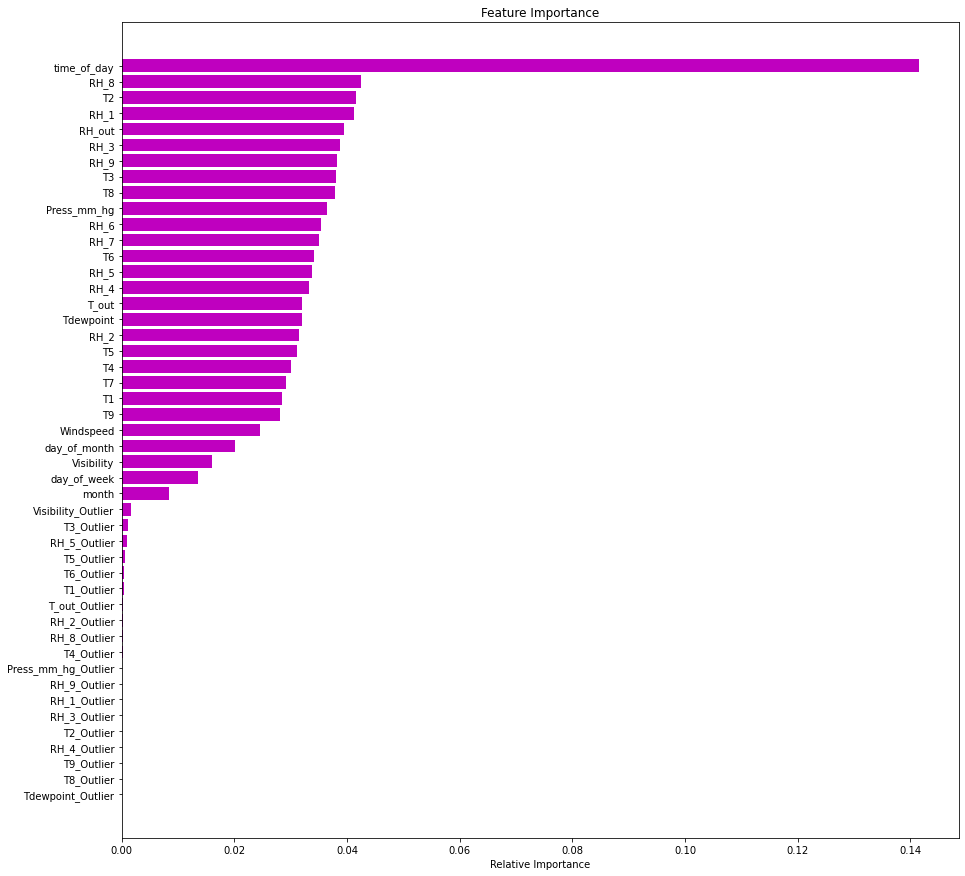

In [88]:
# Getting features importance of decision tree
get_features_importance(tuned_random_forest,X_train_scaled )

##Eli5

In [59]:
!pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [60]:
import eli5 as eli

In [61]:
for_instance=2

In [62]:
eli.explain_weights(tuned_random_forest)

Weight,Feature
0.1415 ± 0.1265,x24
0.0424 ± 0.0281,x15
0.0417 ± 0.0360,x2
0.0413 ± 0.0221,x1
0.0394 ± 0.0382,x20
0.0388 ± 0.0175,x5
0.0383 ± 0.0215,x17
0.0381 ± 0.0204,x4
0.0380 ± 0.0194,x14
0.0365 ± 0.0151,x19


In [63]:
 y_test.iloc[1]

50.0

In [64]:
eli.show_prediction(tuned_random_forest, X_test_scaled.iloc[1],
                    feature_names=list(X_test_scaled.columns),
                    show_feature_values=True)

## LIME

In this section, we’ll be
assessing predictions of the tuned model
using LIME.

In [71]:
pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [72]:
categorical_names = list(X_train_scaled.columns[28:])

In [73]:
len(X_train_scaled.columns)

47

In [76]:
categorical_features = np.arange(28,59,1)

In [78]:
import lime
import lime.lime_tabular
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_scaled.values,
                                                   feature_names= list(X_train_scaled.columns),
                                                   categorical_names = categorical_names,
                                                   categorical_features =categorical_features,
                                                   mode = 'regression'
                                                   )  

In [79]:
exp = explainer.explain_instance(X_test_scaled.iloc[9],tuned_random_forest.predict,num_features=10,top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)
print("Actual Value", y_test.iloc[9])

Actual Value 100.0


The appliance energy values have increased
compared to the previous case, as there’s
positive contribution for the Phase of Day
not being Night and the Phase of the Day
being Evening.

In [80]:
exp = explainer.explain_instance(X_test_scaled.iloc[55],tuned_random_forest.predict,num_features=10,top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)
print("Actual Value", y_test.iloc[55])

Actual Value 50.0


Here, we have an appliance
energy consumption prediction of 51.52
Wh. This is a relatively low value as it is
considerably close to its minimum value
of 51.52.

In [81]:
exp = explainer.explain_instance(X_test_scaled.iloc[108],tuned_random_forest.predict,num_features=10,top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)
print("Actual Value", y_test.iloc[108])

Actual Value 90.0


#Conclusion



*   The household appliance energy
consumption prediction models based on
Linear Regression, Lasso Regression, Ridge
Regression, DecisionTree Regressor
Random Forest Regressor, Adaptive
Boosting Regressor, Gradient Boosting
Regressor, Bagging Regressor, K Neighbors
Regressor and Linear SVM are explored.

* Upon appropriate preprocessing and fitting
the ten models, we compare and evaluate the
best model with lowest error and the highest
R-squared score.

* When evaluating the influence of Random
Variable attribute the linear models have
assigned near zero weights to the random
variable, negating its influence in prediction
of the target variable.

* Random Forest Regressor was found to be
the best performing model with an
R-squared score of 0.767.

* After optimizing the hyperparameters of the
Random Forest Regressor, its R-squared
score increased from 0.767 to 0.771.

* We find that this model’s predictions are
mainly contributed by the time of the day
and temperature in rooms 3 and 2.

* As this dataset has a time component to it,
we believe that better performances can be
achieved by using Time Series Analysis
concepts.




In [82]:

# Applying PCA function on training
# and testing set of X component
from sklearn.decomposition import PCA
  
pca = PCA(n_components = 30)
  
X_train = pca.fit_transform(X_train_scaled)
X_test = pca.transform(X_test_scaled)
  
explained_variance = pca.explained_variance_ratio_

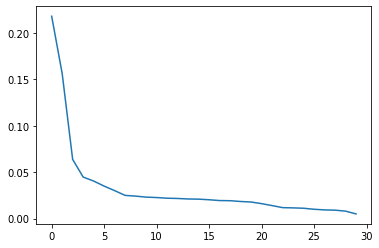

In [83]:
plt.plot(explained_variance)

In [84]:
#Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

calc_vif(df[[i for i in df.describe().columns]])


,variables,VIF
0,Appliances,14.936914
1,T1,19.504461
2,RH_1,14.997422
3,T2,20.217973
4,RH_2,15.243271
5,T3,11.685203
6,RH_3,9.918700
7,T4,9.043501
8,RH_4,15.696116
9,T5,10.846723


In [85]:
# Import f_classif from Scikit-learn
from sklearn.feature_selection import f_classif
# Create f_classif object to calculate F-value
f_value = f_classif(X_train, y_train)
# Print the name and F-value of each feature
for feature in zip(numerical_features+['Appliances'], f_value[0]):
 print(feature)

('T1', 122.84603716905376)
('RH_1', 14.844143387848604)
('T2', 32.389867151756214)
('RH_2', 94.64626102166126)
('T3', 6.163171537072971)
('RH_3', 2.8372053225704605)
('T4', 4.780390386187802)
('RH_4', 84.87441624590474)
('T5', 4.48431421141041)
('RH_5', 4.5747235764097995)
('T6', 3.349829893902691)
('RH_6', 4.803492911778359)
('T7', 4.409784434599403)
('RH_7', 11.552253814335067)
('T8', 2.5364622339361245)
('RH_8', 5.047653659527342)
('T9', 11.277692717475189)
('RH_9', 5.547737060108052)
('T_out', 17.275286406785355)
('Press_mm_hg', 4.466534848991909)
('RH_out', 2.0946549238560013)
('Windspeed', 10.092526409117825)
('Visibility', 3.478298582315507)
('Tdewpoint', 5.700374150003711)
('rv1', 4.742955010440457)
('time_of_day', 2.298046263140509)
('day_of_month', 1.3137638465143728)
('Appliances', 12.419711775066032)


In [86]:
# Import VarianceThreshold from Scikit-learn
from sklearn.feature_selection import VarianceThreshold
# Create VarianceThreshold object to perform variance thresholding
selector = VarianceThreshold()
# Perform variance thresholding
selector.fit_transform(X_train)
# Print the name and variance of each feature
for feature in zip(numerical_features+['Appliances'], selector.variances_):
 print(feature)

('T1', 10.247681263289161)
('RH_1', 7.351153632494073)
('T2', 2.9939118799669737)
('RH_2', 2.0998586821414587)
('T3', 1.8977292640422274)
('RH_3', 1.640931443241328)
('T4', 1.4118023543997436)
('RH_4', 1.1713485371914278)
('T5', 1.1341115426702815)
('RH_5', 1.0835312112457152)
('T6', 1.0618179682994282)
('RH_6', 1.0282740416342326)
('T7', 1.015102615600809)
('RH_7', 0.9891284203979602)
('T8', 0.9804366599219408)
('RH_8', 0.9498897831425709)
('T9', 0.9091888318103707)
('RH_9', 0.9018404287370162)
('T_out', 0.8616308860278146)
('Press_mm_hg', 0.8354425390843951)
('RH_out', 0.7530464804523399)
('Windspeed', 0.6546362011775058)
('Visibility', 0.5507834295862513)
('Tdewpoint', 0.5382325445090668)
('rv1', 0.5198657574281015)
('time_of_day', 0.46779458196633245)
('day_of_month', 0.4352761123684959)
('Appliances', 0.42176744272254746)
